<a href="https://colab.research.google.com/github/yrodriguezmd/Surgical_instruments/blob/main/Models/notebooks/Model_M/Set_S_U1_Model_M1_oct23.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Labelled dataset = Set_S (Set_1_7)

Unlabelled dataset = Set_U1

Model_M 

In [ ]:
!wget https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
!bash install_colab.sh

In [2]:
exit()

In [ ]:
import icevision

In [3]:
from icevision.all import *
print('icevision v',icevision.__version__)
print('torch v',torch.__version__)
print('torchvision v',torchvision.__version__)

icevision v 0.10.0a1
torch v 1.9.0+cu111
torchvision v 0.10.0+cu111


In [ ]:
# contains labelled data
!git clone https://github.com/yrodriguezmd/Surgical_instruments.git

In [5]:
# contains unlabelled data
from google.colab import drive
drive.mount('/content/gdrive', force_remount = True)

Mounted at /content/gdrive


Merge Set_S labelled data with Set_U1 pseudolabelled data

In [ ]:
!ls Surgical_instruments/Sets/Set_S/subsets/Set_1_7

notebooks  README.md  test  train  valid  whole_set


In [8]:
!ls gdrive/MyDrive/Surgical_instruments/pseudolabels

pseudo_1_.json


In [9]:
# Use Set_1_7 labelled data
labelled_path = Path('Surgical_instruments/Sets/Set_S/subsets/Set_1_7')
pseudolabelled_path = Path('gdrive/MyDrive/Surgical_instruments')

lab_train_parser = parsers.COCOBBoxParser(
    annotations_filepath = labelled_path/'train/Set_1_7_annotations.coco.json',
    img_dir = labelled_path/'train'
)

ps_train_parser = parsers.COCOBBoxParser(
    annotations_filepath = pseudolabelled_path/'pseudolabels/pseudo_1_.json', #uploaded
    img_dir = pseudolabelled_path/'Set_U1'
)

valid_parser = parsers.COCOBBoxParser(
    annotations_filepath = labelled_path/'valid/Set_1_7_annotations.coco.json',
    img_dir = labelled_path/'valid'
)

In [10]:
whole = SingleSplitSplitter()

train_records, *_ = lab_train_parser.parse(data_splitter = whole)

train_records_ps, *_ = ps_train_parser.parse(data_splitter = whole)

valid_records, *_ = valid_parser.parse(data_splitter = whole)

  0%|          | 0/1323 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/677 [00:00<?, ?it/s]

  0%|          | 0/3280 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/1368 [00:00<?, ?it/s]

AUTOFIX-SUCCESS - (record_id: 13) - Clipping bbox ymax from 313.84659 to image height 312 (Before: <BBox (xmin:5.7618713, ymin:79.92746, xmax:380.4242513, ymax:313.84659)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 23) - Clipping bbox xmax from 380.471085 to image width 350 (Before: <BBox (xmin:16.187515, ymin:61.28041, xmax:380.471085, ymax:373.05263)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 23) - Clipping bbox ymax from 373.05263 to image height 350 (Before: <BBox (xmin:16.187515, ymin:61.28041, xmax:350, ymax:373.05263)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 31) - Clipping bbox ymax from 319.634434 to image height 316 (Before: <BBox (xmin:129.63193, ymin:202.35175, xmax:310.086, ymax:319.634434)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 33) - Clipping bbox ymax from 253.07422000000003 to image height 174 (Before: <BBox (xmin:5.0390778, ymi

  0%|          | 0/361 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/186 [00:00<?, ?it/s]

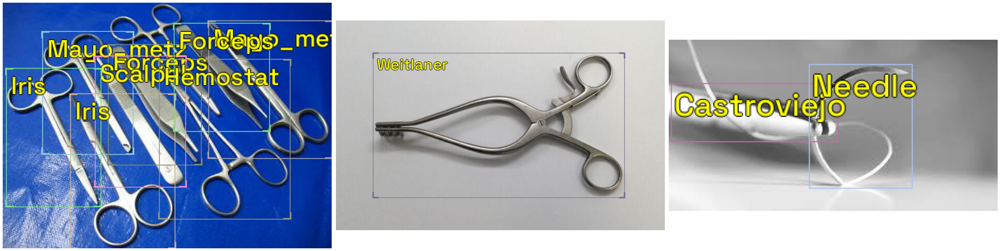

In [11]:
show_records(train_records[0:3],ncols=3, font_size=30, label_color = '#ffff00')

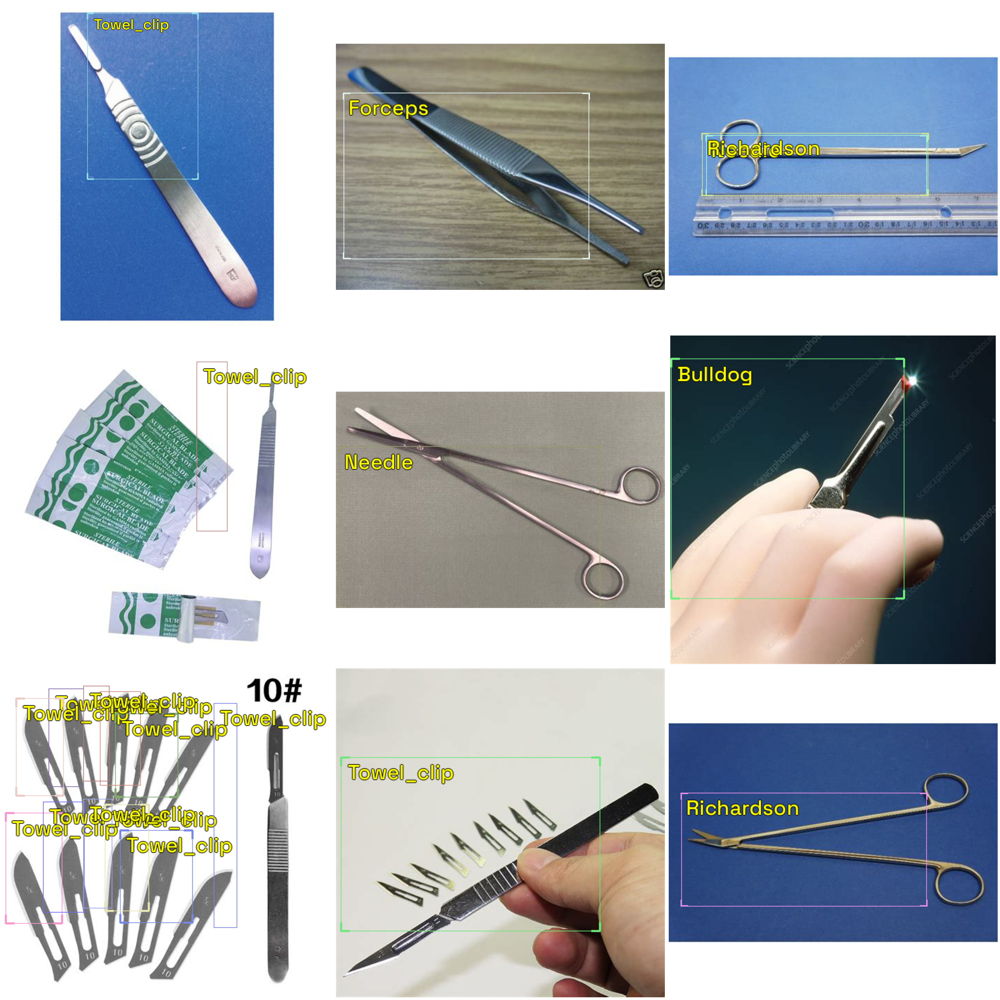

In [12]:
show_records(train_records_ps[9:18],ncols=3, font_size=30, label_color = '#ffff00')

In [13]:
merged_train_records = torch.utils.data.ConcatDataset([train_records, train_records_ps])
#print(len(train_records))
#print(len(train_records_ps))
#print(len(merged_train_records))

Train Model_M using Set_S_U1 to generate Model_M1

In [ ]:
#image_path = Path('Surgical_instruments/Sets/Set_S/subsets/Set_1_7/train')

#img_files = get_image_files(image_path)

#img = PIL.Image.open(img_files[601]) ##
#img = img.convert('RGB')

#img.to_thumb(150,150)

In [14]:
classes = ['Towel_clip', 'Castroviejo', 'Yankauer', 'Hemostat', 'Army_navy', 'Richardson', 'Potts', 'Iris', 'Bulldog', 'Forceps', 'Scalpel', 'Frazier', 'Needle', 'Weitlaner', 'Mayo_metz']
class_map = ClassMap(classes)
len(class_map)

16

Parse data

In [37]:
#skip
path = Path('Surgical_instruments/Sets/Set_S/subsets/Set_1_7') # adjust if use git clone vs gdrive
#path = Path('gdrive/MyDrive/Surgical_instruments/Set_1_5.v1i.coco')

train_parser = parsers.COCOBBoxParser(
    annotations_filepath = path/'train/Set_1_7_annotations.coco.json',
    #annotations_filepath = path/'train/Set_1_5_annotations.coco.json',
    #img_dir = path/'train'
    img_dir = path/'train'
)

valid_parser = parsers.COCOBBoxParser(
    annotations_filepath = path/'valid/Set_1_7_annotations.coco.json',
    #annotations_filepath = path/'valid/Set_1_5_annotations.coco.json',
    #img_dir = path/'valid'
    img_dir = path/'valid'
)

In [ ]:
#skip
# dataset already split in annotation tool, maintain grouping

whole = SingleSplitSplitter()

train_records, *_ = train_parser.parse(data_splitter = whole)

valid_records, *_ = valid_parser.parse(data_splitter = whole)

  0%|          | 0/1323 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/677 [00:00<?, ?it/s]

  0%|          | 0/361 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/186 [00:00<?, ?it/s]

In [15]:
#show_records(train_records[0:3],ncols=3, font_size=30, label_color = '#ffff00')

In [16]:
#show_records(valid_records[0:3],ncols=3, font_size=30, label_color = '#ffff00')

In [17]:
presize = 512
image_size = 384

train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=presize), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=image_size), tfms.A.Normalize()])

In [19]:
train_ds = Dataset(merged_train_records, train_tfms) ## Set_S labelled + Set_U1 pseudolabels
valid_ds = Dataset(valid_records, valid_tfms)

In [18]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

from icevision.models.checkpoint import *

model_type = models.mmdet.vfnet ##
backbone = model_type.backbones.resnet50_fpn_mstrain_2x##

#model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(class_map),)# **extra_args)

In [20]:
# manual upload model
from google.colab import files
files.upload()

Saving Model_M_vf_mAP52.3.pth to Model_M_vf_mAP52.3.pth


In [ ]:
from icevision.models import *

checkpoint_path = 'Model_M_vf_mAP52.3.pth'

checkpoint_and_model = model_from_checkpoint(checkpoint_path)
model = checkpoint_and_model['model'] # Model M
model.train()

In [23]:
train_dl = model_type.train_dl(train_ds, batch_size = 16, num_workers = 4,
                               shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=16, num_workers = 4,
                               shuffle=False)

In [25]:
from fastai.callback.wandb import *

wandb.init(project = 'Surgical_instruments', name = 'Model_M1', ##
           reinit = True)

<IPython.core.display.Javascript object>

wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [26]:
learn = model_type.fastai.learner(dls = [train_dl, valid_dl],
                                  model = model, metrics = metrics,#)
                                  cbs = WandbCallback(  )) ##

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


SuggestedLRs(valley=0.0010000000474974513)

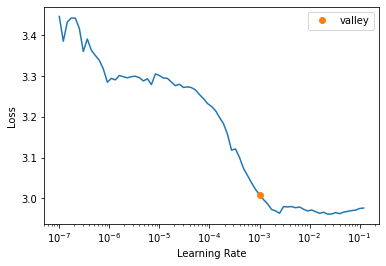

In [27]:
learn.lr_find()

In [28]:
learn.fine_tune(20,5e-04)##

Could not gather input dimensions
WandbCallback requires use of "SaveModelCallback" to log best model
WandbCallback was not able to prepare a DataLoader for logging prediction samples -> 'Dataset' object has no attribute 'items'


epoch,train_loss,valid_loss,COCOMetric,time
0,2.151299,2.100038,0.296627,01:55


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,1.872864,1.708263,0.441076,02:04
1,1.870649,1.725433,0.456809,02:02
2,1.873438,1.775621,0.410656,02:02
3,1.903441,1.766663,0.404501,02:03
4,1.920017,1.843502,0.405063,02:02
5,1.937678,1.858221,0.343324,02:03
6,1.904837,1.893033,0.339637,02:03
7,1.887532,1.814084,0.345422,02:02
8,1.866694,1.798967,0.383493,02:03
9,1.813462,1.853508,0.410733,02:03


In [29]:
learn.fine_tune(80,1e-04)##
# use slightly lower lr 

Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,1.544076,1.825138,0.418461,01:52


/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:324: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/usr/local/lib/python3.7/dist-packages/mmdet/core/anchor/anchor_generator.py:361: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


Could not gather input dimensions


epoch,train_loss,valid_loss,COCOMetric,time
0,1.519723,1.788437,0.423768,02:03
1,1.504489,1.785814,0.420313,02:03
2,1.512706,1.813261,0.431192,02:02
3,1.512673,1.826297,0.432938,02:02
4,1.484122,1.836329,0.415993,02:03
5,1.495874,1.855657,0.410763,02:02
6,1.491280,1.824041,0.408664,02:03
7,1.481138,1.830857,0.425389,02:02
8,1.486938,1.855128,0.387149,02:03
9,1.471249,1.826884,0.425031,02:02


In [30]:
import matplotlib.pyplot as plt
def plot_metrics(learn, title):
  plt.plot(L(learn.recorder.values).itemgot())
  plt.xlabel('epoch')
  plt.ylabel('mAP (green), Loss (blue, orange)')
  plt.title(title)
  plt.text(0,-0.2, 
       'Legend: mAP(green), train_loss(blue), valid_loss(orange')
  plt.ylim(0,1);

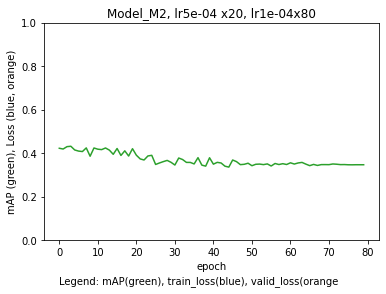

In [31]:
plot_metrics(learn, 'Model_M2, lr5e-04 x20, lr1e-04x80')

In [32]:
import matplotlib.pyplot as plt
def plot_metrics(learn, title):
  plt.plot(L(learn.recorder.values).itemgot())
  plt.xlabel('epoch')
  plt.ylabel('mAP (green), Loss (blue, orange)')
  plt.title(title)
  plt.text(0,-0.2, 
       'Legend: mAP(green), train_loss(blue), valid_loss(orange')
  plt.ylim(0,2);

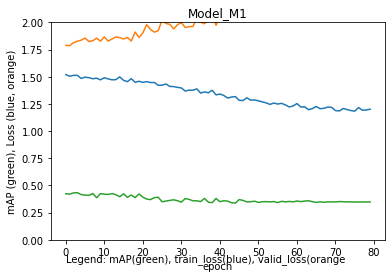

In [33]:
plot_metrics(learn, 'Model_M1')

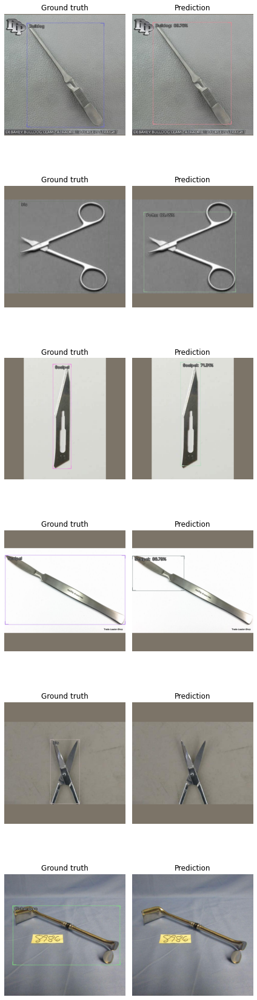

In [34]:
model_type.show_results(model, valid_ds)

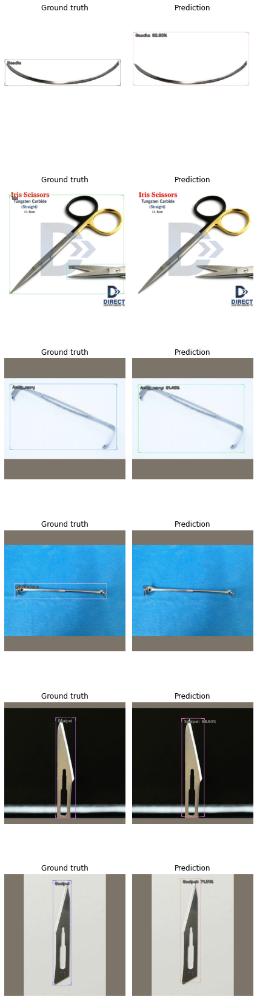

In [35]:
model_type.show_results(model, valid_ds)

In [38]:
from icevision.models import *

checkpoint_path = 'Model_M1_vf_mAP35.0.pth'

save_icevision_checkpoint(model, 
                        model_name='mmdet.vfnet', ## 
                        backbone_name='resnet50_fpn_mstrain_2x', ##
                        classes =  train_parser.class_map.get_classes(), 
                        img_size=image_size, 
                        filename=checkpoint_path,
                        meta={'icevision_version': '0.9.1'})

# download model

Inference using Set_S test_set

In [ ]:
model.eval()

  0%|          | 0/185 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:122


  0%|          | 0/93 [00:00<?, ?it/s]

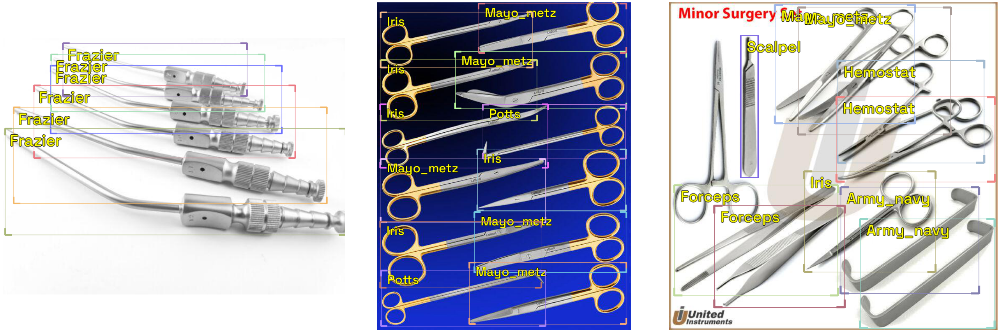

In [40]:
path = Path('Surgical_instruments/Sets/Set_S/subsets/Set_1_7') # adjust if use git clone vs gdrive

test_parser = parsers.COCOBBoxParser(
    annotations_filepath = path/'test/Set_1_7_annotations.coco.json',
    #annotations_filepath = path/'train/Set_1_5_annotations.coco.json',
    #img_dir = path/'train'
    img_dir = path/'test')

whole = SingleSplitSplitter()

test_records, *_ = test_parser.parse(data_splitter = whole)

show_records(test_records[0:3],ncols=3, font_size=30, label_color = '#ffff00')

In [41]:
classes = ['Towel_clip', 'Castroviejo', 'Yankauer', 'Hemostat', 'Army_navy', 'Richardson', 'Potts', 'Iris', 'Bulldog', 'Forceps', 'Scalpel', 'Frazier', 'Needle', 'Weitlaner', 'Mayo_metz']
class_map = ClassMap(classes)

In [42]:
img_size = 384 

valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()])

#infer_ds = Dataset.from_images(imgs_array, valid_tfms, class_map = class_map)
infer_ds = Dataset(test_records, valid_tfms)#, class_map = class_map)

In [43]:
infer_dl = model_type.infer_dl(infer_ds, 
                               batch_size=4, shuffle=False)

preds_saved = model_type.predict_from_dl(model, infer_dl,
                                          keep_images=True, 
                                         detection_threshold = 0.5) ##

  0%|          | 0/24 [00:00<?, ?it/s]

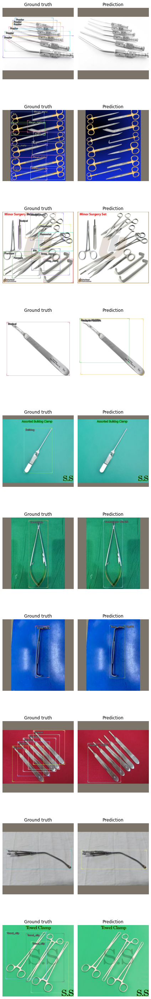

In [44]:
#test
show_preds(preds = preds_saved[0:10])
# with detection threshold 0.5

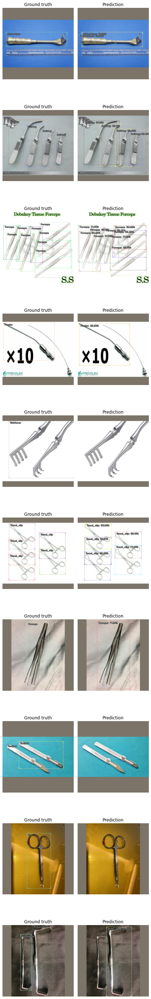

In [45]:
show_preds(preds = preds_saved[10:20])

Do inference on Set_U2 (+ retained Set_U1) to generate pseudolabels.

Merge unlabelled data Set_U2 and retained (unlabelled data from Set_U1)

In [ ]:
!ls gdrive/MyDrive/Surgical_instruments
#Set_U2 with 1364 images

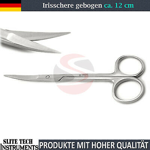

In [46]:
images = Path('gdrive/MyDrive/Surgical_instruments/Set_U2')

img_files = get_image_files(images)

img = PIL.Image.open(img_files[1301])
#img = img.convert('RGB')

img.to_thumb(150,150)

In [47]:
# same classes

imgs_array = [PIL.Image.open(file) for file in img_files]

imgs_array = [image.convert('RGB') for image in imgs_array]

img_size = 384 

valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(img_size), tfms.A.Normalize()])

infer_ds = Dataset.from_images(imgs_array, valid_tfms, class_map = class_map)

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


Not able to merge retained data for now.  Do Inference on Set_U2 only.


Address retained Set_U1 data later.

In [84]:
infer_dl = model_type.infer_dl(infer_ds,## 
                               batch_size=4, shuffle=False)

preds_saved = model_type.predict_from_dl(model, infer_dl,
                                          keep_images=True, 
                                         detection_threshold = 0.5)

  0%|          | 0/341 [00:00<?, ?it/s]

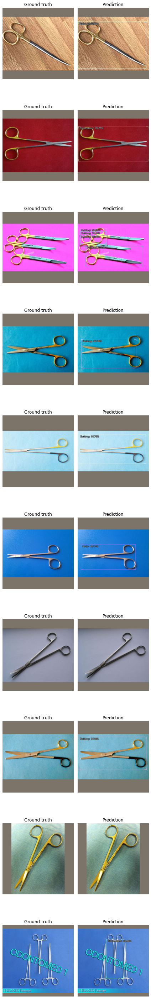

In [85]:
show_preds (preds = preds_saved[0:10])

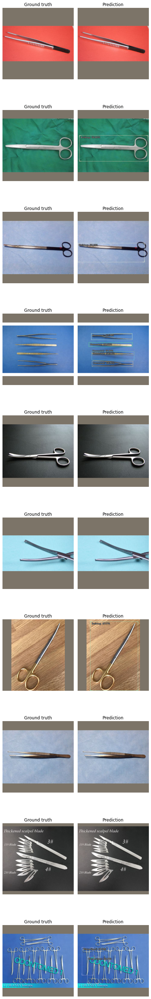

In [87]:
show_preds (preds = preds_saved[10:20])

In [51]:
#retained_ds = Path('gdrive/MyDrive/Surgical_instruments/retained_images/Set_U1_a') ##

In [63]:
!ls Set_U1_a

Set_U1_a


In [64]:
# manual
Set_U1_a = [Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01090.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01114.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01144.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01162.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01163.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01164.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01167.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01171.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01177.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01178.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01181.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01182.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01185.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01190.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01191.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01195.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01213.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01230.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01232.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01303.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01325.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01334.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01343.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01359.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01360.jpeg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01364.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01367.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01422.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01461.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01505.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01508.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01523.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01537.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01546.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01577.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01589.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01609.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01615.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01633.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01639.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01642.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01667.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01679.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01686.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01725.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01732.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01768.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01781.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01785.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01797.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01803.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01816.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01828.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01840.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01841.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01852.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01859.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01864.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01873.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01904.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01924.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01958.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01964.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01968.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01973.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01979.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01982.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01994.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02003.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02006.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02011.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02013.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02033.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02097.JPG'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02154.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02222.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02232.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02233.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02234.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02238.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02240.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02246.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02247.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02254.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02259.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02262.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02266.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02284.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02286.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02294.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02298.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02299.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02303.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02308.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02312.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02314.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02318.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02322.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02332.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02334.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02378.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02432.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02433.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02439.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02443.jpg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02505.jpeg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02513.jpeg'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02545.png'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02547.png'), Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled02549.png')]

In [68]:
len(Set_U1_a)

110

In [69]:
# merge new unlabelled dataset Set_U2 with retained unlabelled images from Set_U1

infer_ds_ = torch.utils.data.ConcatDataset([infer_ds, Set_U1_a])

In [71]:
print(len(infer_ds))

1364


In [72]:
len(infer_ds_)

1474

In [ ]:
!ls gdrive/MyDrive/Surgical_instruments/Set_U1

In [ ]:
path = Path('gdrive/MyDrive/Surgical_instruments/')
retained_parser = parsers.COCOBBoxParser(
    annotations_filepath = path/'retained_images/Set_U1_a',#Set_U1_a,
    img_dir = path/'Set_U1')

whole = SingleSplitSplitter()

retained_records, *_ = retained_parser.parse(data_splitter = whole)

show_records(retained_records[0:3],ncols=3, font_size=30, label_color = '#ffff00')

Generate pseudolabels from Set_U2 using Teacher model Model_M1

In [ ]:
#! git clone https://github.com/yrodriguezmd/Surgical_instruments.git

In [ ]:
# use gdrive
#from google.colab import drive
#drive.mount('/content/gdrive', force_remount = True)

Mounted at /content/gdrive


In [ ]:
#!ls gdrive/MyDrive/Surgical_instruments
# Set_U1 with 1479 files

Models		  Set_1_5.v1i.coco  Set_2.v1i.coco
Set_1_3.v1i.coco  Set_1.v1i.coco    Set_U1


In [73]:
classes = ['Towel_clip', 'Castroviejo', 'Yankauer', 'Hemostat', 'Army_navy', 'Richardson', 'Potts', 'Iris', 'Bulldog', 'Forceps', 'Scalpel', 'Frazier', 'Needle', 'Weitlaner', 'Mayo_metz']
class_map = ClassMap(classes)
len(class_map)

16

Generate annotation file

In [88]:
for pred in preds_saved:
  pred.add_component(FilepathRecordComponent())

for _ in range(len(preds_saved)): 
  preds_saved[_].set_filepath(img_files[_]) 

conv = convert_preds_to_coco_style(preds_saved) 

In [89]:
add_info = {
    "info": {
        "year": "2021",
        "version": "1",
        "description": "Exported from roboflow.ai",
        "contributor": "",
        "url": "https://public.roboflow.ai/object-detection/undefined",
        "date_created": "2021-10-05T20:13:09+00:00"
    },
    "licenses": [
        {
            "id": 1,
            "url": "https://creativecommons.org/licenses/by/4.0/",
            "name": "CC BY 4.0"
        }
    ],
    "categories": [
        {
            "id": 0,
            "name": "instruments",
            "supercategory": "none"
        },
        {
            "id": 1,
            "name": "Army_navy",
            "supercategory": "Retractor"
        },
        {
            "id": 2,
            "name": "Bulldog",
            "supercategory": "Clamp"
        },
        {
            "id": 3,
            "name": "Castroviejo",
            "supercategory": "Needle_holder"
        },
        {
            "id": 4,
            "name": "Forceps",
            "supercategory": "Forceps"
        },
        {
            "id": 5,
            "name": "Frazier",
            "supercategory": "Suction"
        },
        {
            "id": 6,
            "name": "Hemostat",
            "supercategory": "Clamp"
        },
        {
            "id": 7,
            "name": "Iris",
            "supercategory": "Scissors"
        },
       {
            "id": 8,
            "name": "Mayo_metz",
            "supercategory": "Scissors"
        },
        {
            "id": 9,
            "name": "Needle",
            "supercategory": "Needle"
        },
        {
            "id": 10,
            "name": "Potts",
            "supercategory": "Scissors"
        },
        {
            "id": 11,
            "name": "Richardson",
            "supercategory": "Retractor"
        },
        {
            "id": 12,
            "name": "Scalpel",
            "supercategory": "Scalpel"
        },
        {
            "id": 13,
            "name": "Towel_clip",
            "supercategory": "Clamp"
        },
        {
            "id": 14,
            "name": "Weitlaner",
            "supercategory": "Retractor"
        },
        {
            "id": 15,
            "name": "Yankauer",
            "supercategory": "Suction"
        }
    ]
}

In [90]:
pseudo_2 = {**add_info, **conv} ##

f = open('pseudo_2.json','w') ##
f.write(str(pseudo_2)) ##
f.close()
##  edit ' to ": pseudo_2_

Parse labelled and pseudolabelled data.

In [ ]:
#labelled data
! git clone https://github.com/yrodriguezmd/Surgical_instruments.git

In [139]:
!ls gdrive/MyDrive/Surgical_instruments/

Models		  Set_1_5.v1i.coco  Set_2.v1i.coco
Set_1_3.v1i.coco  Set_1.v1i.coco    Set_U1


In [91]:
# Use Set_1_7 labelled data
labelled_path = Path('Surgical_instruments/Sets/Set_S/subsets/Set_1_7')
pseudolabelled_path = Path('gdrive/MyDrive/Surgical_instruments/Set_U2')

lab_train_parser = parsers.COCOBBoxParser(
    annotations_filepath = labelled_path/'train/Set_1_7_annotations.coco.json',
    img_dir = labelled_path/'train'
)

ps_train_parser = parsers.COCOBBoxParser(
    annotations_filepath = 'pseudo_2_.json', #uploaded
    img_dir = pseudolabelled_path
)

valid_parser = parsers.COCOBBoxParser(
    annotations_filepath = labelled_path/'valid/Set_1_7_annotations.coco.json',
    img_dir = labelled_path/'valid'
)

In [ ]:
whole = SingleSplitSplitter()

train_records, *_ = lab_train_parser.parse(data_splitter = whole)

train_records_ps, *_ = ps_train_parser.parse(data_splitter = whole)

valid_records, *_ = valid_parser.parse(data_splitter = whole)

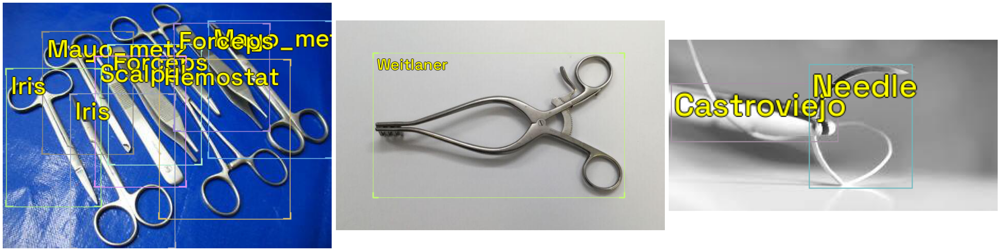

In [93]:
show_records(train_records[0:3],ncols=3, font_size=30, label_color = '#ffff00')

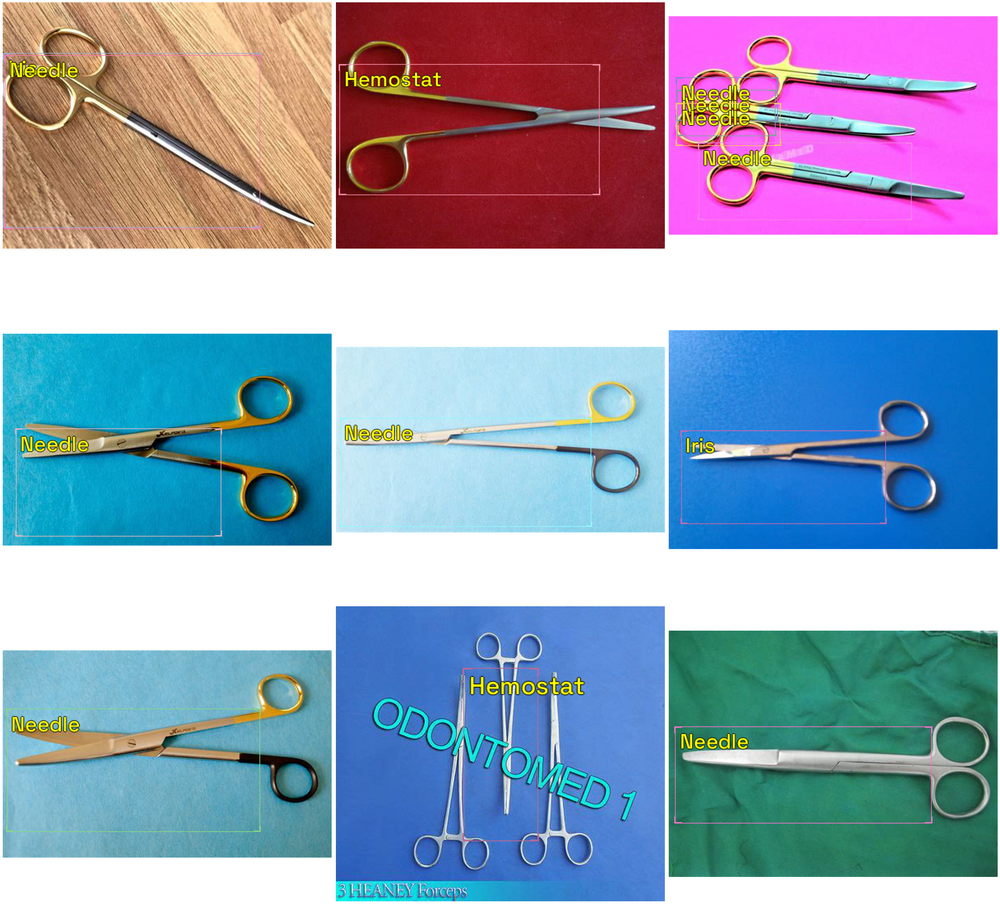

In [94]:
show_records(train_records_ps[0:9],ncols=3, font_size=30, label_color = '#ffff00')
# more reasonable compared to preds_saved?!

Merge labelled records and pseudolabelled records

In [95]:
merged_train_records = torch.utils.data.ConcatDataset([train_records, train_records_ps])
print(len(train_records))
print(len(train_records_ps))
print(len(merged_train_records))

677
906
1583


In [96]:
1- ( (1364 - 906) / 1364)
# 92% of the unlabelled images have pseudolabels

0.6642228739002933

Skip below for now

Merge unannotated images from Set_U1 to Set_U2

In [149]:
preds_saved[0].pred

BaseRecord

common: 
	- Filepath: gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01073.jpg
	- Img: None
	- Image size ImgSize(width=384, height=384)
	- Img: 384x384x3 <np.ndarray> Image
	- Record ID: 0
detection: 
	- Class Map: <ClassMap: {'background': 0, 'Towel_clip': 1, 'Castroviejo': 2, 'Yankauer': 3, 'Hemostat': 4, 'Army_navy': 5, 'Richardson': 6, 'Potts': 7, 'Iris': 8, 'Bulldog': 9, 'Forceps': 10, 'Scalpel': 11, 'Frazier': 12, 'Needle': 13, 'Weitlaner': 14, 'Mayo_metz': 15}>
	- Labels: [7, 7, 7, 13]
	- Scores: [    0.90459     0.66428     0.55014     0.51469]
	- BBoxes: [<BBox (xmin:40.46257019042969, ymin:168.257568359375, xmax:136.4140167236328, ymax:208.45103454589844)>, <BBox (xmin:94.69554901123047, ymin:177.61798095703125, xmax:158.8835906982422, ymax:247.94129943847656)>, <BBox (xmin:209.93145751953125, ymin:161.52713012695312, xmax:291.4521179199219, ymax:206.20155334472656)>, <BBox (xmin:40.46257019042969, ymin:168.257568359375, xmax:136.4140167236328, ymax:208.451

In [150]:
len(preds_saved)

1478

In [151]:
Set_U1_a = [] # retained images (no pseudolabels)
for x in range(len(preds_saved)):
  if preds_saved[x].pred.detection.labels ==[]:
    Set_U1_a.append(preds_saved[x].pred.common.filepath)


In [166]:
Set_U1_a[0]

Path('gdrive/MyDrive/Surgical_instruments/Set_U1/Unlabelled01090.jpg')

In [153]:
imgs_retained = [PIL.Image.open(file) for file in Set_U1_a]

retained_ds = Dataset.from_images(imgs_retained, valid_tfms, class_map = class_map)

retained_ds

<Dataset with 110 items>

In [155]:
len(train_records_ps) + len(retained_ds)
# approximates dataset size (1479)

1478

In [159]:
retained_ds_ = Dataset(imgs_retained, valid_tfms,)# class_map = class_map)
retained_ds_

<Dataset with 110 items>

In [161]:
#torch.save(retained_ds, 'retained_ds.pt')
#download locally
# doesn't seem to work

In [162]:
#torch.load('retained_ds.pt')

<Dataset with 110 items>

In [168]:
f = open('Set_U1_a','w') 
f.write(str(Set_U1_a)) 
f.close()
# download locally

Train Teacher Model_M using merged labelled + pseudolabelled data, to generate Student Model_M1